In [1]:
import numpy as np
import matplotlib.pyplot as plt
import h5py

from sklearn.decomposition import PCA

from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import roc_curve
from sklearn.preprocessing import StandardScaler
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV

from astroML.utils import completeness_contamination

import corner

rc = {"font.family" : "serif", 
      "mathtext.fontset" : "cm",
      "font.size" : "12",
      "figure.figsize" : [8,8]}
plt.rcParams.update(rc)

%config InlineBackend.figure_format='retina'

In [2]:
file = '../../GW_samples.h5'
data = h5py.File(file, 'r')

In [3]:
list(data.keys())

['chi1x',
 'chi1y',
 'chi1z',
 'chi2x',
 'chi2y',
 'chi2z',
 'dec',
 'det',
 'iota',
 'mtot',
 'psi',
 'q',
 'ra',
 'snr',
 'z']

In [4]:
#build the arrays
N_train = 10000
N_test = int(0.3 * N_train)

chi1x_test, chi1x_train = data['chi1x'][:N_test], data['chi1x'][N_test:N_train]
chi1y_test, chi1y_train = data['chi1y'][:N_test], data['chi1y'][N_test:N_train]
chi1z_test, chi1z_train = data['chi1z'][:N_test], data['chi1z'][N_test:N_train]

chi2x_test, chi2x_train = data['chi2x'][:N_test], data['chi2x'][N_test:N_train]
chi2y_test, chi2y_train = data['chi2y'][:N_test], data['chi2y'][N_test:N_train]
chi2z_test, chi2z_train = data['chi2z'][:N_test], data['chi2z'][N_test:N_train]

dec_test, dec_train = data['dec'][:N_test], data['dec'][N_test:N_train]
ra_test, ra_train = data['ra'][:N_test], data['ra'][N_test:N_train]
det_test, det_train = data['det'][:N_test], data['det'][N_test:N_train] # 0 or 1
iota_test, iota_train = data['iota'][:N_test], data['iota'][N_test:N_train]
mtot_test, mtot_train = data['mtot'][:N_test], data['mtot'][N_test:N_train]
psi_test, psi_train = data['psi'][:N_test], data['psi'][N_test:N_train]
q_test, q_train = data['q'][:N_test], data['q'][N_test:N_train]
snr_test, snr_train = data['snr'][:N_test], data['snr'][N_test:N_train]
z_test, z_train = data['z'][:N_test], data['z'][N_test:N_train]

In [5]:
data_train = np.column_stack((z_train, mtot_train, q_train, chi1z_train, chi2z_train,  iota_train, psi_train))
data_test = np.column_stack((z_test, mtot_test, q_test, chi1z_test, chi2z_test, iota_test, psi_test))
labels = [r'$z$', r'$M_{tot}$', r'$q$', r'$\chi_{1z}$', r'$\chi_{2z}$', r'$\iota$', r'$\psi$']

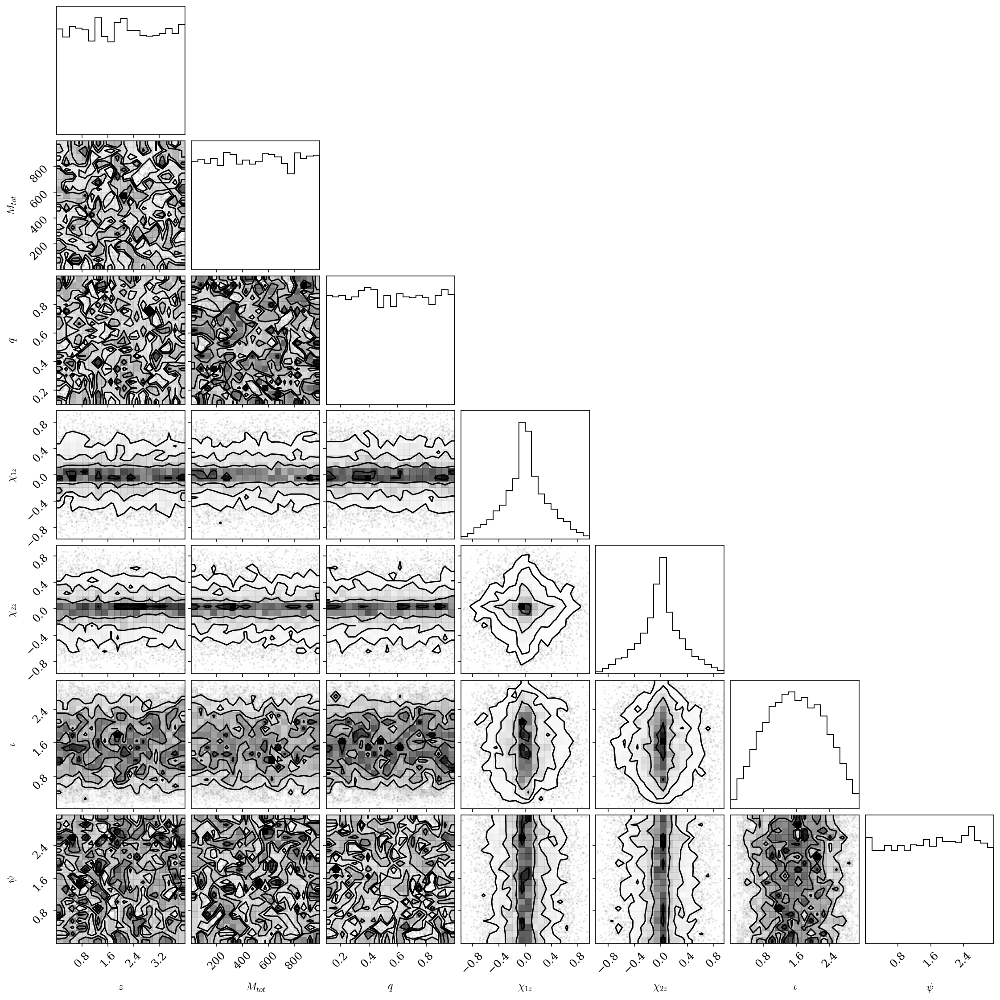

In [6]:
corner.corner(data_train, labels=labels);

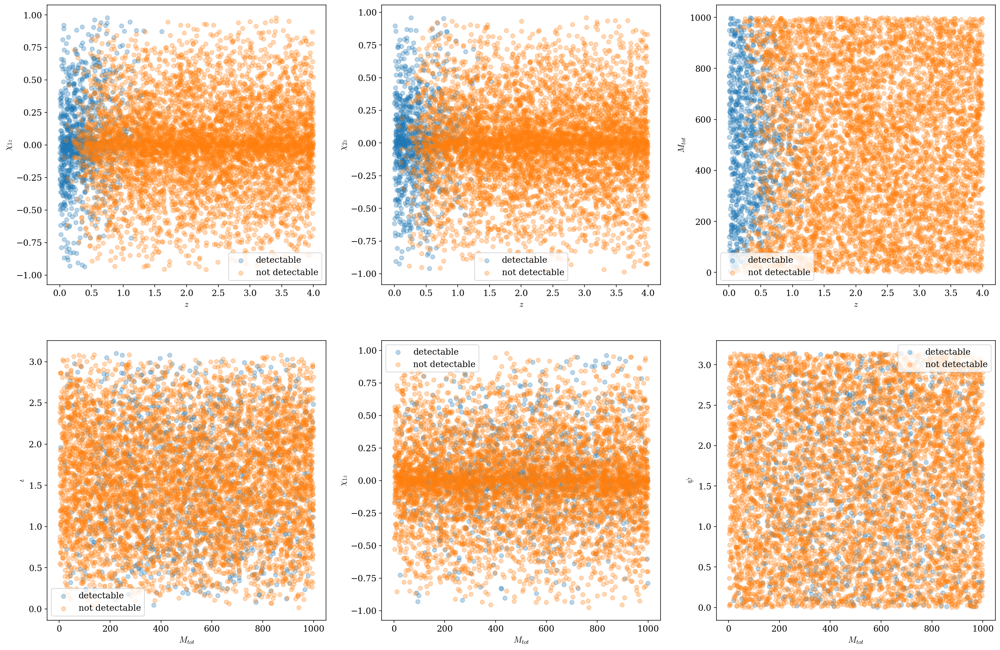

In [7]:
plt.figure(figsize=(24,16))

ax = plt.subplot(231)
ax.scatter(z_train[det_train == 1], chi1z_train[det_train == 1], alpha = 0.3, label = 'detectable')
ax.scatter(z_train[det_train == 0], chi1z_train[det_train == 0], alpha = 0.3, label = 'not detectable')
ax.set_xlabel(r'$z$')
ax.set_ylabel(r'$\chi_{1z}$')
ax.legend()

ax = plt.subplot(232)
ax.scatter(z_train[det_train == 1], chi2z_train[det_train == 1], alpha = 0.3, label = 'detectable')
ax.scatter(z_train[det_train == 0], chi2z_train[det_train == 0], alpha = 0.3, label = 'not detectable')
ax.set_xlabel(r'$z$')
ax.set_ylabel(r'$\chi_{2z}$')
ax.legend()

ax = plt.subplot(233)
ax.scatter(z_train[det_train == 1], mtot_train[det_train == 1], alpha = 0.3, label = 'detectable')
ax.scatter(z_train[det_train == 0], mtot_train[det_train == 0], alpha = 0.3, label = 'not detectable')
ax.set_xlabel(r'$z$')
ax.set_ylabel(r'$M_{tot}$')
ax.legend()

ax = plt.subplot(234)
ax.scatter(mtot_train[det_train == 1], iota_train[det_train == 1], alpha = 0.3, label = 'detectable')
ax.scatter(mtot_train[det_train == 0], iota_train[det_train == 0], alpha = 0.3, label = 'not detectable')
ax.set_xlabel(r'$M_{tot}$')
ax.set_ylabel(r'$\iota$')
ax.legend()

ax = plt.subplot(235)
ax.scatter(mtot_train[det_train == 1], chi1z_train[det_train == 1], alpha = 0.3, label = 'detectable')
ax.scatter(mtot_train[det_train == 0], chi1z_train[det_train == 0], alpha = 0.3, label = 'not detectable')
ax.set_xlabel(r'$M_{tot}$')
ax.set_ylabel(r'$\chi_{1z}$')
ax.legend()

ax = plt.subplot(236)
ax.scatter(mtot_train[det_train == 1], psi_train[det_train == 1], alpha = 0.3, label = 'detectable')
ax.scatter(mtot_train[det_train == 0], psi_train[det_train == 0], alpha = 0.3, label = 'not detectable')
ax.set_xlabel(r'$M_{tot}$')
ax.set_ylabel(r'$\psi$')
ax.legend()

plt.show()

In [8]:
def return_accuracy(pred, test):
    true = len(pred[pred == test])
    return true / len(test)

In [9]:
accuracy = [] 

### gaussian naive biases

In [10]:
classifiers, det_pred, det_proba = [], [], []
N_features = data_train.shape[1]
for n in range(1, N_features+1):
    scaler = StandardScaler()
    X_train = scaler.fit_transform(data_train[:,0:n])
    X_test = scaler.fit_transform(data_test[:,0:n])
    
    clf = GaussianNB()

    clf.fit(X_train, det_train)
    classifiers.append(clf)

    det_pred.append(clf.predict(X_test))
    det_proba.append(clf.predict_proba(X_test)[:,1])

In [11]:
# Compute the decision boundary
clf = classifiers[1] #z - M_tot

xlim = (min(X_train[:,0]), max(X_train[:,0]))
ylim = (min(X_train[:,1]), max(X_train[:,1]))

xx, yy = np.meshgrid(np.linspace(xlim[0], xlim[1], 810),
                     np.linspace(ylim[0], ylim[1], 710))

#Z = clf.predict_proba(np.c_[yy.ravel(), xx.ravel()])
Z = clf.predict_proba(np.c_[xx.ravel(), yy.ravel()])
Z = Z[:, 1].reshape(xx.shape)

In [12]:
# ROC curve
fpr_list, tpr_list, thresh_list = [], [], []

for proba in det_proba:
    fpr, tpr, thresh = roc_curve(det_test, proba)
    fpr_list.append(fpr)
    tpr_list.append(tpr)
    thresh_list.append(thresh)

In [13]:
#contamination and completeness
completeness, contamination = completeness_contamination(det_pred, det_test)
print('completeness: ', completeness)
print('contamination: ', contamination)

completeness:  [0.82926829 0.84257206 0.84035477 0.84257206 0.84700665 0.85587583
 0.85587583]
contamination:  [0.29699248 0.28436911 0.27946768 0.26782274 0.26819923 0.25338491
 0.25769231]


In [14]:
#accuracy
accuracy_NB = []
for pred in det_pred:
    acc = return_accuracy(pred, det_test)
    accuracy_NB.append(acc)
accuracy.append(max(accuracy_NB))

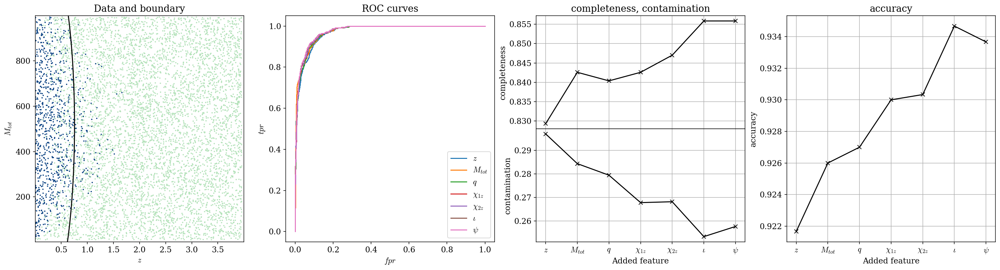

In [15]:
fig = plt.figure(figsize=(24, 6))
fig.subplots_adjust(bottom=0.15, top=0.95, hspace=0.0,
                    left=0.1, right=0.95, wspace=0.2)
ax1 = plt.subplot(141) #data: z vs M_tot
ax2 = plt.subplot(142) #roc curves
ax3 = plt.subplot(243) #completeness
ax4 = plt.subplot(247) #contamination
ax5 = plt.subplot(144) #accuracy
#------------------------------------------------------------
im = ax1.scatter(scaler.inverse_transform(X_train)[:, 0], scaler.inverse_transform(X_train)[:, 1], c=det_train,
                s=4, lw=0, cmap=plt.cm.GnBu, zorder=2)
im.set_clim(-0.5, 1)

xlim = (min(data_train[:,0]), max(data_train[:,0]))
ylim = (min(data_train[:,1]), max(data_train[:,1]))

xx, yy = np.meshgrid(np.linspace(xlim[0], xlim[1], 810),
                     np.linspace(ylim[0], ylim[1], 710))
ax1.contour(xx, yy, Z, [0.5], colors='k')

ax1.set_xlim(xlim)
ax1.set_ylim(ylim)

ax1.set_xlabel(r'$z$')
ax1.set_ylabel(r'$M_{tot}$')
ax1.set_title('Data and boundary')
#------------------------------------------------------------
for fpr, tpr, label in zip(fpr_list, tpr_list, labels):
    ax2.plot(fpr, tpr, label = label)
    ax2.legend()
    
ax2.set_xlabel(r'$fpr$')
ax2.set_ylabel(r'$tpr$')
ax2.set_title('ROC curves')
#------------------------------------------------------------
ax3.plot(range(1,N_features+1), completeness, 'x-k')
ax3.set_ylabel('completeness')
ax3.xaxis.set_major_formatter(plt.NullFormatter())
ax3.set_title('completeness, contamination')
ax3.set_xticks(range(1,8), labels)
ax3.grid(True)
#------------------------------------------------------------
ax4.plot(range(1,N_features+1), contamination, 'x-k')
ax4.set_xlabel('Added feature')
ax4.set_ylabel('contamination')
ax4.xaxis.set_major_formatter(plt.FormatStrFormatter('%i'))
ax4.set_xticks(range(1,8), labels)
ax4.grid(True)
#------------------------------------------------------------
ax5.plot(range(1,N_features+1), accuracy_NB, 'x-k')
ax5.set_xlabel('Added feature')
ax5.set_ylabel('accuracy')
ax5.xaxis.set_major_formatter(plt.FormatStrFormatter('%i'))
ax5.set_title('accuracy')
ax5.set_xticks(range(1,8), labels)
ax5.grid(True)
#------------------------------------------------------------
plt.show()

### Random forest and tree

#### random tree

In [16]:
#cv on a single tree to find the best depth
clf = DecisionTreeClassifier()
d_range = np.arange(1,15)
d_best = []
for n in range(1, N_features+1):
    scaler = StandardScaler()
    X_train = scaler.fit_transform(data_train[:,0:n])
    X_test = scaler.fit_transform(data_test[:,0:n])
    
    grid = GridSearchCV(clf, param_grid={'max_depth': d_range}, cv=5) 
    grid.fit(X_train, det_train)

    best = grid.best_params_['max_depth']
    d_best.append(best)
    print("best parameter choice:", best)

best parameter choice: 1
best parameter choice: 4
best parameter choice: 5
best parameter choice: 5
best parameter choice: 5
best parameter choice: 6
best parameter choice: 6


In [17]:
#single tree, use only z-M_tot 
clf = DecisionTreeClassifier(max_depth=d_best[1])

scaler = StandardScaler()
X_train = scaler.fit_transform(data_train[:,0:2])
X_test = scaler.fit_transform(data_test[:,0:2])
clf.fit(X_train, det_train)

det_pred = clf.predict(X_test)
det_proba = clf.predict_proba(X_test)[:,1]

In [18]:
#boundary
xlim = (min(X_train[:,0]), max(X_train[:,0]))
ylim = (min(X_train[:,1]), max(X_train[:,1]))

xx, yy = np.meshgrid(np.linspace(xlim[0], xlim[1], 810),
                     np.linspace(ylim[0], ylim[1], 710))

Z = clf.predict_proba(np.c_[xx.ravel(), yy.ravel()])
Z = Z[:, 1].reshape(xx.shape)

In [19]:
# ROC curve
fpr, tpr, thresh = roc_curve(det_test, det_proba)    

In [20]:
#contamination and completeness
completeness, contamination = completeness_contamination(det_pred, det_test)
print('completeness: ', completeness)
print('contamination: ', contamination)

completeness:  0.7095343680709535
contamination:  0.08045977011494253


In [21]:
#accuracy
accuracy_tree = return_accuracy(det_pred, det_test)
accuracy.append(accuracy_tree)
accuracy_tree

0.947

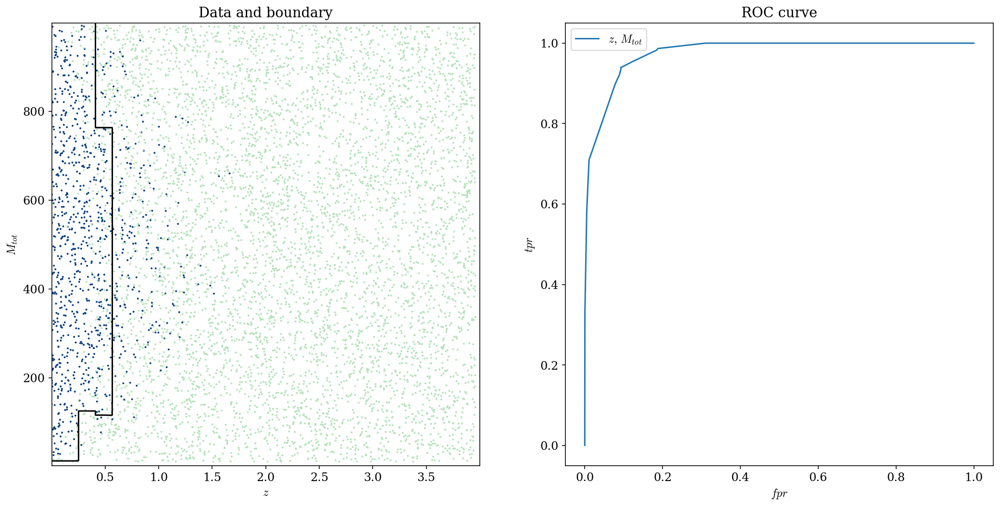

In [22]:
fig = plt.figure(figsize=(16, 8))
fig.subplots_adjust(bottom=0.15, top=0.95, hspace=0.0,
                    left=0.1, right=0.95, wspace=0.2)
ax1 = plt.subplot(121) #data: z vs Mtot
ax2 = plt.subplot(122) #roc curves

#------------------------------------------------------------
im = ax1.scatter(scaler.inverse_transform(X_train)[:, 0], scaler.inverse_transform(X_train)[:, 1], c=det_train,
                s=4, lw=0, cmap=plt.cm.GnBu, zorder=2)
im.set_clim(-0.5, 1)

xlim = (min(data_train[:,0]), max(data_train[:,0]))
ylim = (min(data_train[:,1]), max(data_train[:,1]))

xx, yy = np.meshgrid(np.linspace(xlim[0], xlim[1], 810),
                     np.linspace(ylim[0], ylim[1], 710))
ax1.contour(xx, yy, Z, [0.5], colors='k')

ax1.set_xlim(xlim)
ax1.set_ylim(ylim)

ax1.set_xlabel(r'$z$')
ax1.set_ylabel(r'$M_{tot}$')
ax1.set_title('Data and boundary')
#------------------------------------------------------------
ax2.plot(fpr, tpr, label = r'$z, \, M_{tot}$')
ax2.legend()
    
ax2.set_xlabel(r'$fpr$')
ax2.set_ylabel(r'$tpr$')
ax2.set_title('ROC curve')
#------------------------------------------------------------
plt.show()

#### random forest

In [23]:
#cv to find the best depth, pretty slow
clf = RandomForestClassifier(n_jobs=-1)
d_range = np.arange(1,20)
d_best = []
for n in range(1, N_features+1):
    scaler = StandardScaler()
    X_train = scaler.fit_transform(data_train[:,0:n])
    X_test = scaler.fit_transform(data_test[:,0:n])
    
    grid = GridSearchCV(clf, param_grid={'max_depth': d_range}, cv=3) #5-fold cv is too slow 
    grid.fit(X_train, det_train)

    best_d = grid.best_params_['max_depth']
    d_best.append(best_d)
    print("best parameter choice: depth = %.i" %best_d)

best parameter choice: depth = 2
best parameter choice: depth = 7
best parameter choice: depth = 5
best parameter choice: depth = 6
best parameter choice: depth = 7
best parameter choice: depth = 16
best parameter choice: depth = 19


In [24]:
classifiers, det_pred, det_proba = [], [], []
N_features = data_train.shape[1]
for n,d in zip(range(1, N_features+1), d_best):
    scaler = StandardScaler()
    X_train = scaler.fit_transform(data_train[:,0:n])
    X_test = scaler.fit_transform(data_test[:,0:n])
    
    clf = RandomForestClassifier(max_depth=d, n_jobs=-1)

    clf.fit(X_train, det_train)
    classifiers.append(clf)

    det_pred.append(clf.predict(X_test))
    det_proba.append(clf.predict_proba(X_test)[:,1])

In [25]:
# Compute the decision boundary
clf = classifiers[1] #z - M_tot

xlim = (min(X_train[:,0]), max(X_train[:,0]))
ylim = (min(X_train[:,1]), max(X_train[:,1]))

xx, yy = np.meshgrid(np.linspace(xlim[0], xlim[1], 810),
                     np.linspace(ylim[0], ylim[1], 710))

#Z = clf.predict_proba(np.c_[yy.ravel(), xx.ravel()])
Z = clf.predict_proba(np.c_[xx.ravel(), yy.ravel()])
Z = Z[:, 1].reshape(xx.shape)

In [26]:
# ROC curve
fpr_list, tpr_list, thresh_list = [], [], []

for proba in det_proba:
    fpr, tpr, thresh = roc_curve(det_test, proba)
    fpr_list.append(fpr)
    tpr_list.append(tpr)
    thresh_list.append(thresh)

In [27]:
#contamination and completeness
completeness, contamination = completeness_contamination(det_pred, det_test)
print('completeness: ', completeness)
print('contamination: ', contamination)

completeness:  [0.7405765  0.7405765  0.72727273 0.72283814 0.72283814 0.77827051
 0.78935698]
contamination:  [0.18536585 0.08493151 0.09141274 0.07648725 0.07909605 0.06648936
 0.07049608]


In [28]:
#accuracy
accuracy_forest = []
for pred in det_pred:
    acc = return_accuracy(pred, det_test)
    accuracy_forest.append(acc)
accuracy.append(max(accuracy_forest))

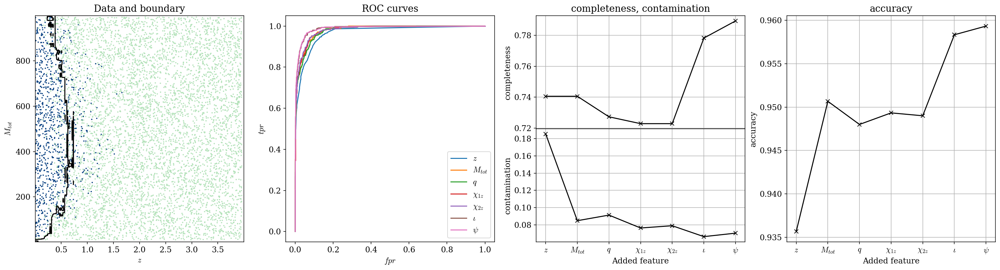

In [29]:
fig = plt.figure(figsize=(24, 6))
fig.subplots_adjust(bottom=0.15, top=0.95, hspace=0.0,
                    left=0.1, right=0.95, wspace=0.2)
ax1 = plt.subplot(141) #data: z vs M_tot
ax2 = plt.subplot(142) #roc curves
ax3 = plt.subplot(243) #completeness
ax4 = plt.subplot(247) #contamination
ax5 = plt.subplot(144) #accuracy
#------------------------------------------------------------
im = ax1.scatter(scaler.inverse_transform(X_train)[:, 0], scaler.inverse_transform(X_train)[:, 1], c=det_train,
                s=4, lw=0, cmap=plt.cm.GnBu, zorder=2)
im.set_clim(-0.5, 1)

xlim = (min(data_train[:,0]), max(data_train[:,0]))
ylim = (min(data_train[:,1]), max(data_train[:,1]))

xx, yy = np.meshgrid(np.linspace(xlim[0], xlim[1], 810),
                     np.linspace(ylim[0], ylim[1], 710))
ax1.contour(xx, yy, Z, [0.5], colors='k')

ax1.set_xlim(xlim)
ax1.set_ylim(ylim)

ax1.set_xlabel(r'$z$')
ax1.set_ylabel(r'$M_{tot}$')
ax1.set_title('Data and boundary')
#------------------------------------------------------------
for fpr, tpr, label in zip(fpr_list, tpr_list, labels):
    ax2.plot(fpr, tpr, label = label)
    ax2.legend()
    
ax2.set_xlabel(r'$fpr$')
ax2.set_ylabel(r'$tpr$')
ax2.set_title('ROC curves')
#------------------------------------------------------------
ax3.plot(range(1,N_features+1), completeness, 'x-k')
ax3.set_ylabel('completeness')
ax3.xaxis.set_major_formatter(plt.NullFormatter())
ax3.set_title('completeness, contamination')
ax3.set_xticks(range(1,8), labels)
ax3.grid(True)
#------------------------------------------------------------
ax4.plot(range(1,N_features+1), contamination, 'x-k')
ax4.set_xlabel('Added feature')
ax4.set_ylabel('contamination')
ax4.xaxis.set_major_formatter(plt.FormatStrFormatter('%i'))
ax4.set_xticks(range(1,8), labels)
ax4.grid(True)
#------------------------------------------------------------
ax5.plot(range(1,N_features+1), accuracy_forest, 'x-k')
ax5.set_xlabel('Added feature')
ax5.set_ylabel('accuracy')
ax5.xaxis.set_major_formatter(plt.FormatStrFormatter('%i'))
ax5.set_title('accuracy')
ax5.set_xticks(range(1,8), labels)
ax5.grid(True)
#------------------------------------------------------------
plt.show()

In [30]:
methods = ['Gaussian naive bayes', 'Random tree', 'Random forest']
for name, acc in zip(methods, accuracy):
    print(name + ': accuracy =', acc)

Gaussian naive bayes: accuracy = 0.9346666666666666
Random tree: accuracy = 0.947
Random forest: accuracy = 0.9593333333333334


## Reduction

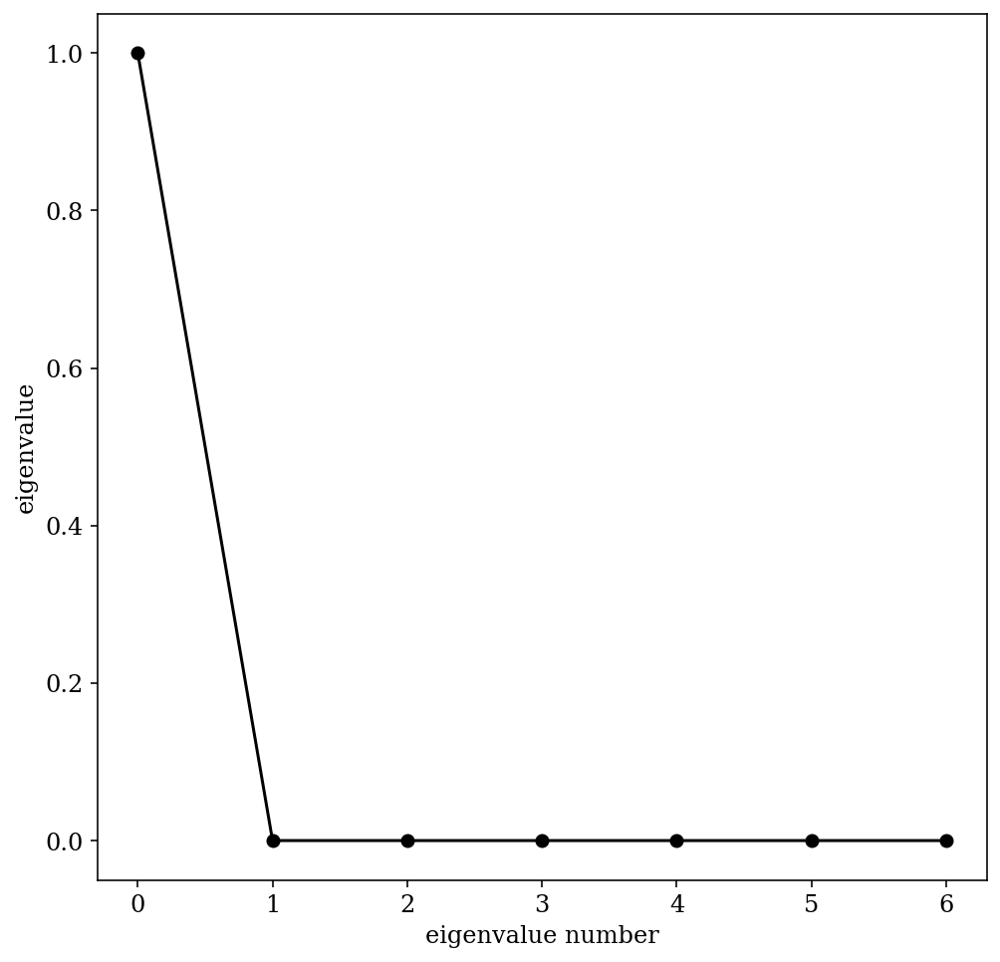

In [31]:
n_components = len(data_train[0,:])
pca = PCA(n_components = n_components)
pca.fit(data_train)
evals = pca.explained_variance_ratio_ 

plt.plot(np.arange(n_components), evals, '-ok')
plt.xlabel('eigenvalue number')
plt.ylabel('eigenvalue')
plt.show()

In [32]:
evals

array([9.99965010e-01, 1.60834584e-05, 9.85641686e-06, 5.57086690e-06,
       1.35292272e-06, 1.30978102e-06, 8.16413889e-07])

basically all the variance is explained by the first component, I'll use two just to plot and visualize the boundary on a $2D$ grid as before.

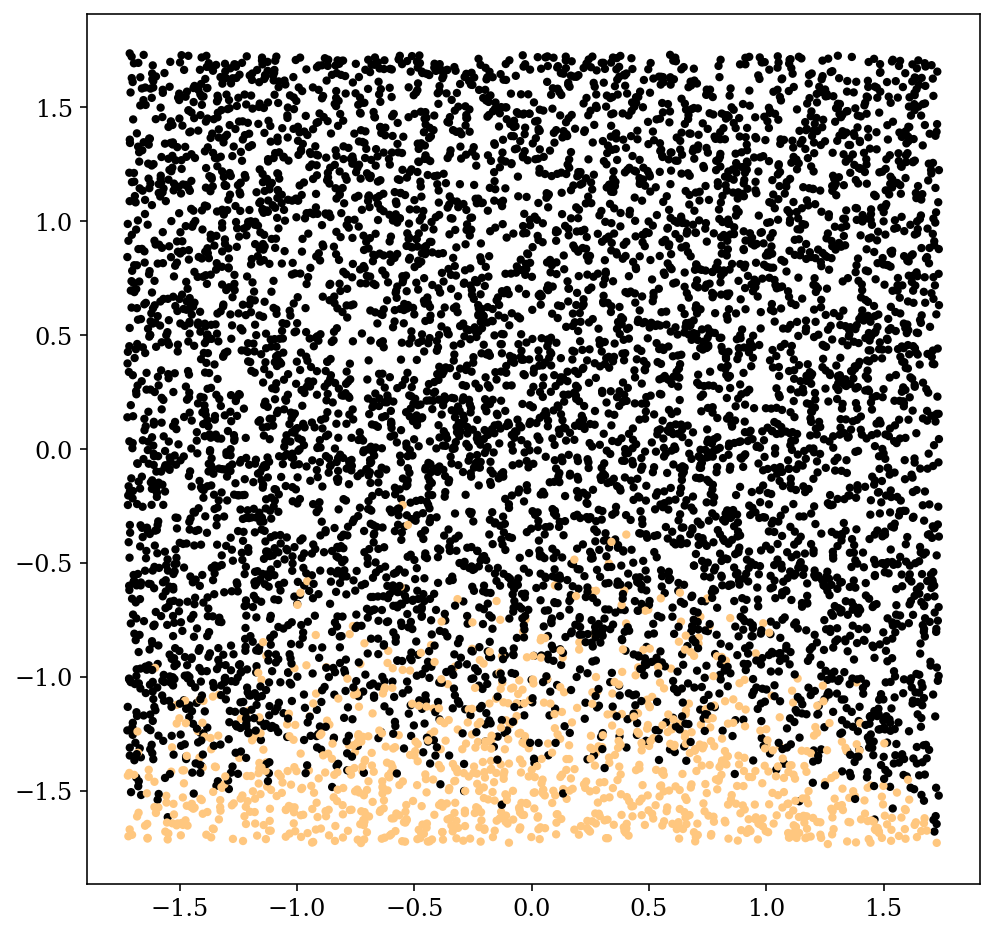

In [33]:
pca = PCA(n_components = 2)
pca.fit(data_train)
scaler = StandardScaler()
X_train_reduced, X_test_reduced  = scaler.fit_transform(pca.fit_transform(data_train)), scaler.fit_transform(pca.fit_transform(data_test))
plt.scatter(X_train_reduced[:,0], X_train_reduced[:,1], 
            c=det_train, s=10, cmap=plt.cm.copper)
plt.show()

### gaussian naive biases

In [34]:
clf = GaussianNB()

clf.fit(X_train_reduced, det_train)

det_pred = clf.predict(X_test_reduced)
det_proba = clf.predict_proba(X_test_reduced)[:,1]

In [35]:
# Compute the decision boundary

xlim = (min(X_train_reduced[:,0]), max(X_train_reduced[:,0]))
ylim = (min(X_train_reduced[:,1]), max(X_train_reduced[:,1]))

xx, yy = np.meshgrid(np.linspace(xlim[0], xlim[1], 810),
                     np.linspace(ylim[0], ylim[1], 710))

Z = clf.predict_proba(np.c_[xx.ravel(), yy.ravel()])
Z = Z[:, 1].reshape(xx.shape)

In [36]:
# ROC curve
fpr, tpr, thresh = roc_curve(det_test, proba)

In [37]:
#contamination and completeness
completeness, contamination = completeness_contamination(det_pred, det_test)
print('completeness: ', completeness)
print('contamination: ', contamination)

completeness:  0.8470066518847007
contamination:  0.277882797731569


In [38]:
#accuracy
accuracy_NB_reduced = return_accuracy(det_pred, det_test)
accuracy.append(accuracy_NB_reduced)

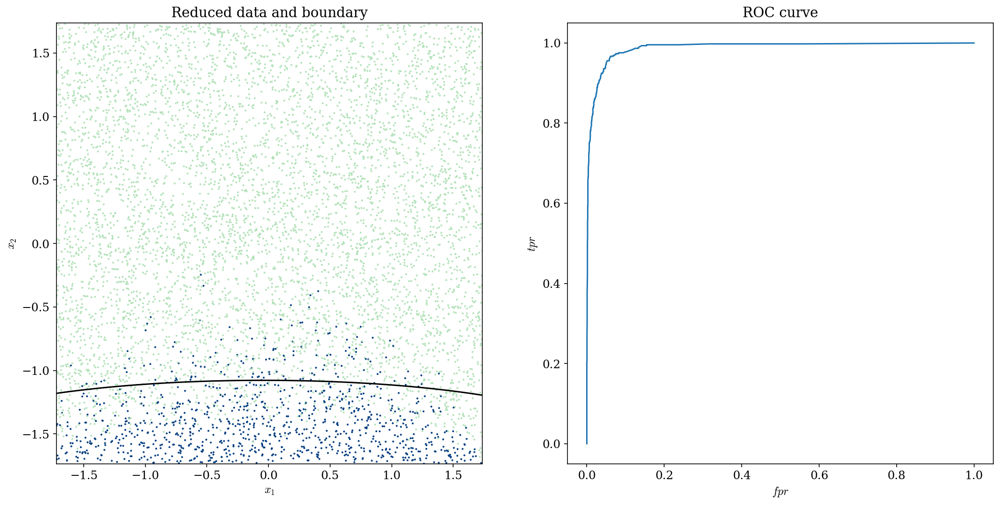

In [39]:
fig = plt.figure(figsize=(16, 8))
fig.subplots_adjust(bottom=0.15, top=0.95, hspace=0.0,
                    left=0.1, right=0.95, wspace=0.2)
ax1 = plt.subplot(121) #reduced data
ax2 = plt.subplot(122) #roc curve
#------------------------------------------------------------
im = ax1.scatter(X_train_reduced[:, 0], X_train_reduced[:, 1], c=det_train,
                s=4, lw=0, cmap=plt.cm.GnBu, zorder=2)
im.set_clim(-0.5, 1)

#xlim = (min(data_train[:,0]), max(data_train[:,0]))
#ylim = (min(data_train[:,1]), max(data_train[:,1]))

#xx, yy = np.meshgrid(np.linspace(xlim[0], xlim[1], 810),
                    # np.linspace(ylim[0], ylim[1], 710))
ax1.contour(xx, yy, Z, [0.5], colors='k')

ax1.set_xlim(xlim)
ax1.set_ylim(ylim)

ax1.set_xlabel(r'$x_1$')
ax1.set_ylabel(r'$x_2$')
ax1.set_title('Reduced data and boundary')
#------------------------------------------------------------
ax2.plot(fpr, tpr, label = label)
    
ax2.set_xlabel(r'$fpr$')
ax2.set_ylabel(r'$tpr$')
ax2.set_title('ROC curve')

plt.show()

### random forest

In [40]:
clf = RandomForestClassifier(n_jobs=-1)
d_range = np.arange(1,20)

grid = GridSearchCV(clf, param_grid={'max_depth': d_range}, cv=5) 
grid.fit(X_train_reduced, det_train)

d_best = grid.best_params_['max_depth']
print("best parameter choice: depth = %.i" %d_best)

best parameter choice: depth = 8


In [41]:
clf = RandomForestClassifier(max_depth=d_best, n_jobs=-1)

clf.fit(X_train_reduced, det_train)

det_pred = clf.predict(X_test_reduced)
det_proba = clf.predict_proba(X_test_reduced)[:,1]

In [42]:
# Compute the decision boundary

xlim = (min(X_train_reduced[:,0]), max(X_train_reduced[:,0]))
ylim = (min(X_train_reduced[:,1]), max(X_train_reduced[:,1]))

xx, yy = np.meshgrid(np.linspace(xlim[0], xlim[1], 810),
                     np.linspace(ylim[0], ylim[1], 710))

#Z = clf.predict_proba(np.c_[yy.ravel(), xx.ravel()])
Z = clf.predict_proba(np.c_[xx.ravel(), yy.ravel()])
Z = Z[:, 1].reshape(xx.shape)

In [43]:
# ROC curve
fpr, tpr, thresh = roc_curve(det_test, proba)

In [44]:
#contamination and completeness
completeness, contamination = completeness_contamination(det_pred, det_test)
print('completeness: ', completeness)
print('contamination: ', contamination)

completeness:  0.7139689578713969
contamination:  0.08522727272727272


In [45]:
#accuracy
accuracy_forest_reduced = return_accuracy(det_pred, det_test)
accuracy.append(accuracy_forest_reduced)

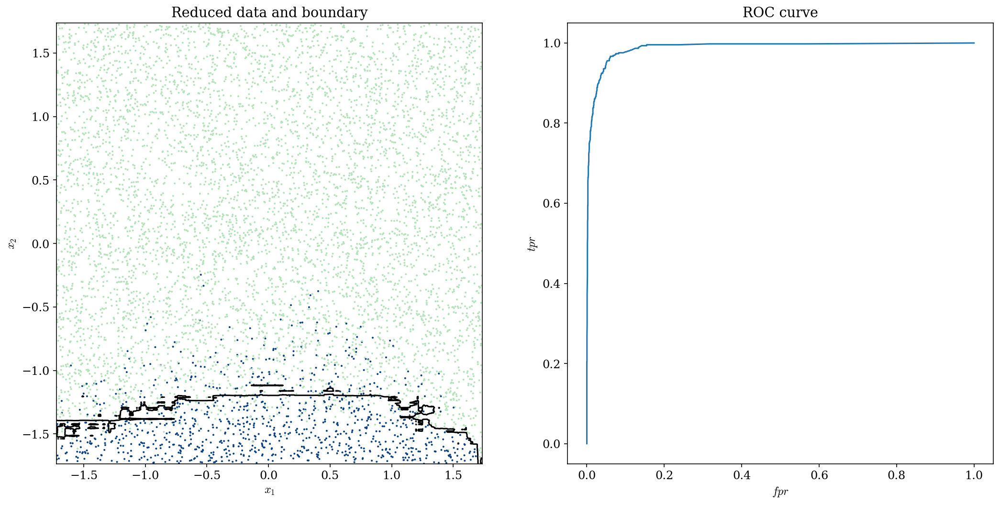

In [46]:
fig = plt.figure(figsize=(16, 8))
fig.subplots_adjust(bottom=0.15, top=0.95, hspace=0.0,
                    left=0.1, right=0.95, wspace=0.2)
ax1 = plt.subplot(121) #reduced data
ax2 = plt.subplot(122) #roc curves

#------------------------------------------------------------
im = ax1.scatter(X_train_reduced[:, 0], X_train_reduced[:, 1], c=det_train,
                s=4, lw=0, cmap=plt.cm.GnBu, zorder=2)
im.set_clim(-0.5, 1)

ax1.contour(xx, yy, Z, [0.5], colors='k')

ax1.set_xlim(xlim)
ax1.set_ylim(ylim)

ax1.set_xlabel(r'$x_1$')
ax1.set_ylabel(r'$x_2$')
ax1.set_title('Reduced data and boundary')
#------------------------------------------------------------
ax2.plot(fpr, tpr, label = label)
    
ax2.set_xlabel(r'$fpr$')
ax2.set_ylabel(r'$tpr$')
ax2.set_title('ROC curve')
#------------------------------------------------------------
plt.show()

In [47]:
methods = methods + ['PCA: Gaussian naive bayes', 'PCA: Random forest']
for name, acc in zip(methods, accuracy):
    print(name + ': accuracy =', acc)

Gaussian naive bayes: accuracy = 0.9346666666666666
Random tree: accuracy = 0.947
Random forest: accuracy = 0.9593333333333334
PCA: Gaussian naive bayes: accuracy = 0.928
PCA: Random forest: accuracy = 0.947


the PCA reduction loses about $1\%$ in accuracy

### Regression on the SNR rather than classification

#### GPR

In [49]:
from sklearn.gaussian_process import GaussianProcessRegressor, kernels
thr = 12 #threshold

In [99]:
n_features = 1 #number of features to use

X_train = data_train[:,:n_features]
X_test = data_test[:,:n_features]

In [123]:
from astroML.utils import pickle_results
from sklearn.model_selection import cross_val_predict

@pickle_results('L20_lengthscale_kernel.pkl')
def CV_regressor(length_scales, X_train, snr_train): #CV
    scores = []
                
    CV_error = lambda snr_predCV: np.sqrt( np.mean((snr_train - snr_predCV)**2) )   
    k = 3 #3fold CV
        
    for length_scale in length_scales:
        kernel = kernels.ConstantKernel(1.0, "fixed") * kernels.RBF(length_scale, "fixed")
        gpr = GaussianProcessRegressor(kernel = kernel)
        snr_predCV = cross_val_predict(gpr, X_train, snr_train, cv = k)
        scores.append(CV_error(snr_predCV))
    
    best = length_scales[np.argmin(scores)]
    return scores, best #return the list too to produce a plot

In [117]:
length_scales = np.linspace(1e-2, 1, 20)

scores, best_ls = CV_regressor(length_scales, X_train, snr_train)

@pickle_results: computing results and saving to 'L20_lengthscale_kernel.pkl'


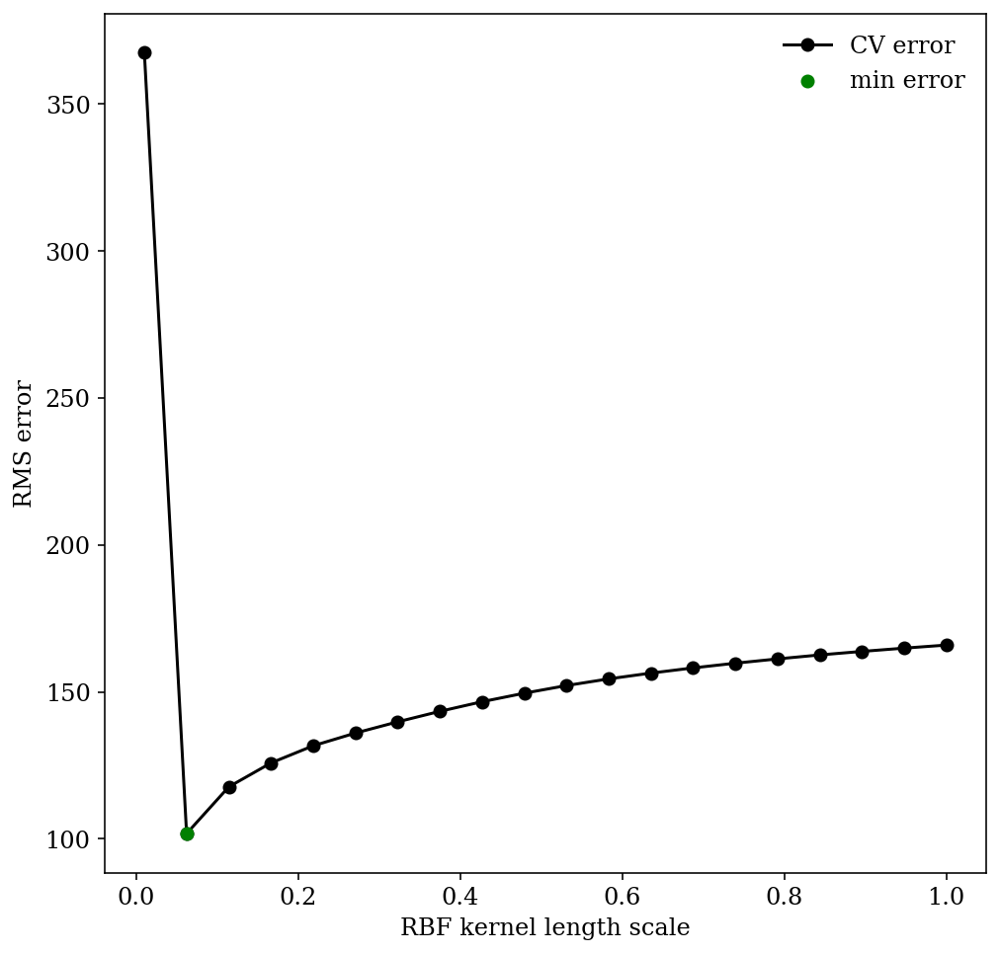

In [118]:
plt.plot(length_scales, scores, '-ok', zorder = 1, label = 'CV error')
plt.scatter(length_scales[np.argmin(scores)], scores[np.argmin(scores)], c='g', zorder = 2, label = 'min error')
plt.xlabel('RBF kernel length scale')
plt.ylabel('RMS error')
plt.legend(frameon = False)
plt.show()

such a large rms error probably because of the huge scattering within the dataset (see plot below)

In [119]:
kernel = kernels.ConstantKernel(1.0, "fixed") * kernels.RBF(best_ls, "fixed")
gpr = GaussianProcessRegressor(kernel = kernel)
gpr.fit(X_train, snr_train)

GaussianProcessRegressor(kernel=1**2 * RBF(length_scale=0.0621))

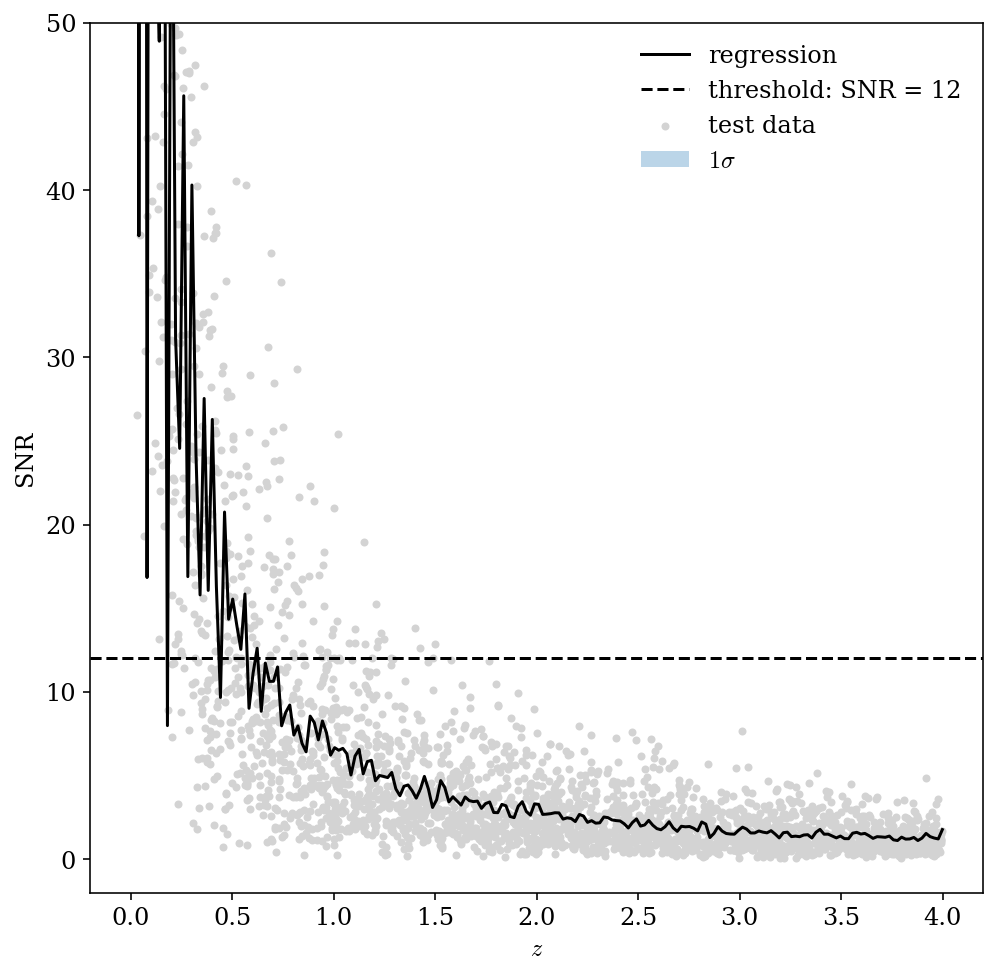

In [137]:
#-- plot

ndim = X_train.shape[1]
Xgrid = np.vstack(([np.linspace(min(X_train[:,i]), max(X_train[:,i]), 200) for i in range(ndim)])).T

#Xgrid = np.linspace(min(X_train[:,0]), max(X_train[:,0]), 200)[:, None]
snr_plot, sigma_plot = gpr.predict(Xgrid, return_std=True)

plt.plot(Xgrid[:,0], snr_plot, c='k', label = 'regression')
plt.axhline(thr, color= 'k', linestyle = 'dashed', label = 'threshold: SNR = 12')
plt.scatter(X_test[:,0], snr_test, marker = '.', c='lightgrey', label='test data')
plt.fill_between(Xgrid[:,0], snr_plot - sigma_plot, snr_plot + sigma_plot, alpha = 0.3, label = r'$1\sigma$')

plt.xlabel(r"$z$")
plt.ylabel("SNR")
plt.ylim(-2,50)
plt.legend(frameon = False)
plt.show()

suspicious?

In [131]:
snr_gpr = gpr.predict(X_test, return_std=False)

In [132]:
labels = np.zeros_like(snr_gpr)
labels[snr_gpr >= thr] = 1

In [133]:
accuracy_gpr = len(labels[labels == det_test]) / len(labels)
methods.append('GPR')
accuracy.append(accuracy_gpr)
print('The accuracy using the regression approach is ', accuracy_gpr)

The accuracy using the regression approach is  0.9286666666666666


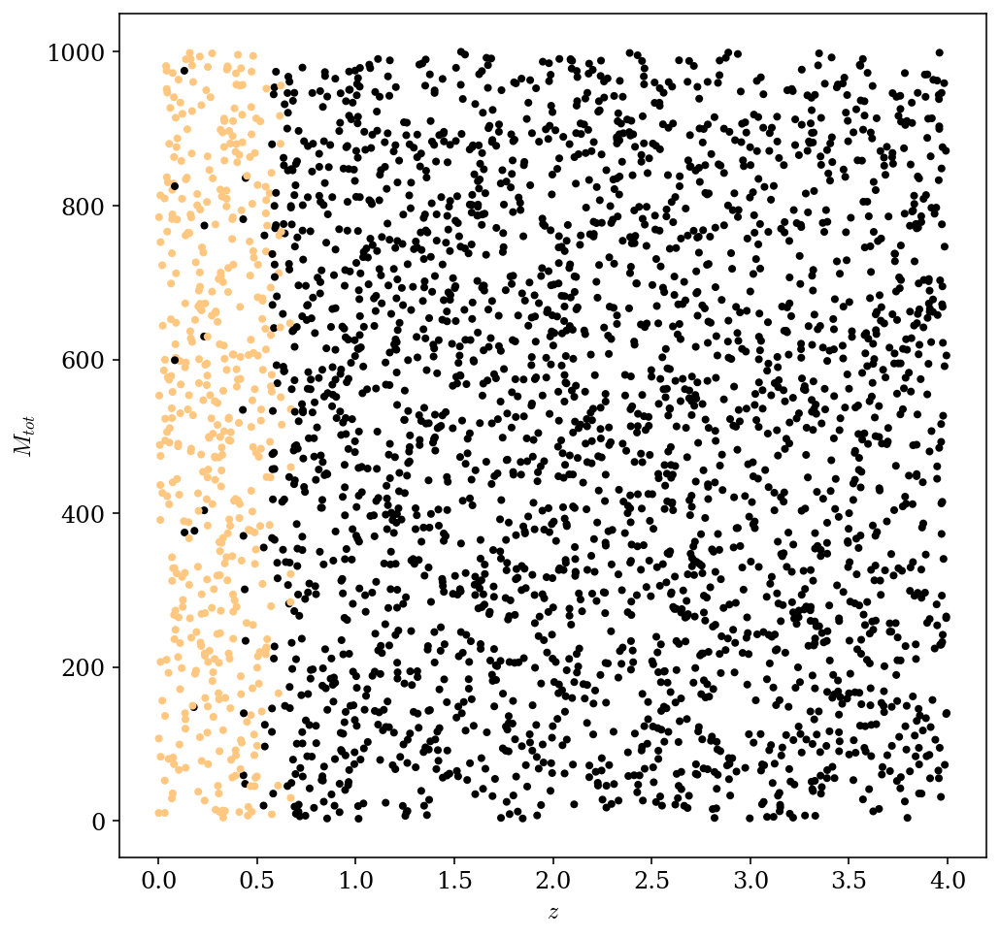

In [134]:
plt.scatter(data_test[:,0], data_test[:,1], marker = '.', c = labels, cmap = 'copper')
plt.xlabel(r'$z$')
plt.ylabel(r'$M_{tot}$')
plt.show()

Not a bad result (similar to the GaussianNB with PCA) but all the classification schemes above produce larger accuracies

#### kernel regression

In [122]:
from astroML.linear_model import NadarayaWatson

In [128]:
@pickle_results('L20_bw_Nadaraya.pkl')
def CV_bw(bandwidths, X, snr): #CV
    bw_list = []
    
    error = lambda snr_true, snr_pred: np.sqrt( np.mean((snr_true - snr_pred)**2) )   
    K = 5 #5fold CV
    
    l = int(X_train.shape[0] / K)
    for k in range(K):
        X_CV = X[k*l:(k+1)*l]
        snr_CV = snr[k*l:(k+1)*l]
        
        X_train_cv = np.delete(X, np.arange(k*l, (k+1)*l), axis = 0)
        snr_train_cv = np.delete(snr, np.arange(k*l, (k+1)*l), axis = 0)
        err_train, err_CV = [],[]
        for bw in bandwidths:
            model = NadarayaWatson('gaussian', bw)
            model.fit(X_train_cv, snr_train_cv)
            
            err_train.append(error(snr_train_cv, model.predict(X_train_cv)))
            err_CV.append(error(snr_CV, model.predict(X_CV)))
    
        best_bw = bandwidths[np.argmin(err_CV)]
        bw_list.append(best_bw)
    best = np.mean(bw_list)
    return best 

In [129]:
bandwidths = np.linspace(1e-3, 1e-1, 20)
best_bw = CV_bw(bandwidths, X_train, snr_train)

@pickle_results: computing results and saving to 'L20_bw_Nadaraya.pkl'


In [130]:
model = NadarayaWatson('gaussian', best_bw)
model.fit(X_train, snr_train)

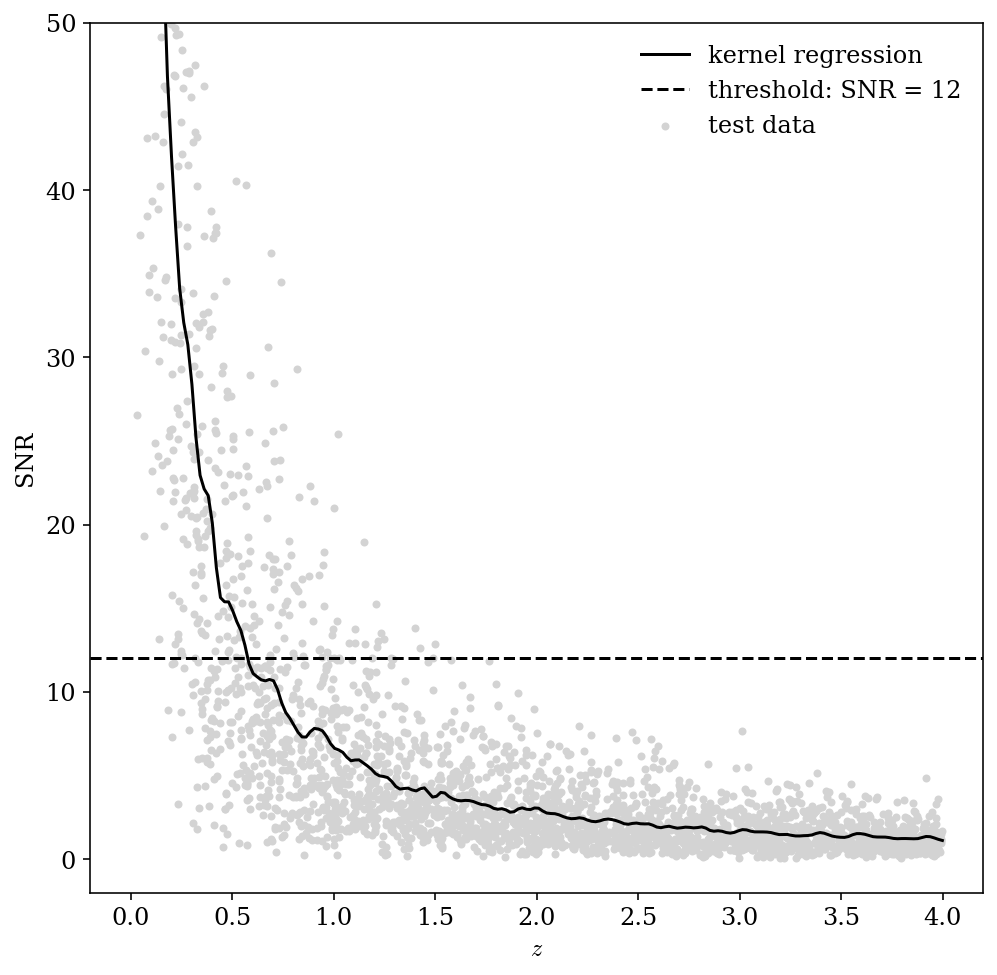

In [136]:
#-- plot
ndim = X_train.shape[1]
Xgrid = np.vstack(([np.linspace(min(X_train[:,i]), max(X_train[:,i]), 200) for i in range(ndim)])).T

#Xgrid = np.linspace(min(X_train[:,0]), max(X_train[:,0]), 200)[:, None]
snr_plot = model.predict(Xgrid)

plt.plot(Xgrid[:,0], snr_plot, c='k', label = 'kernel regression')
plt.axhline(thr, color= 'k', linestyle = 'dashed', label = 'threshold: SNR = 12')
plt.scatter(X_test[:,0], snr_test, marker = '.', c='lightgrey', label='test data')

plt.xlabel(r"$z$")
plt.ylabel("SNR")
plt.ylim(-2,50)
plt.legend(frameon = False)
plt.show()

In [141]:
snr_kernel = model.predict(X_test)

In [142]:
labels = np.zeros_like(snr_kernel)
labels[snr_kernel >= thr] = 1

In [143]:
accuracy_kernel = len(labels[labels == det_test]) / len(labels)
methods.append('kernel')
accuracy.append(accuracy_kernel)
print('The accuracy using the Nadaraya Watson approach is ', accuracy_kernel)

The accuracy using the Nadaraya Watson approach is  0.9333333333333333


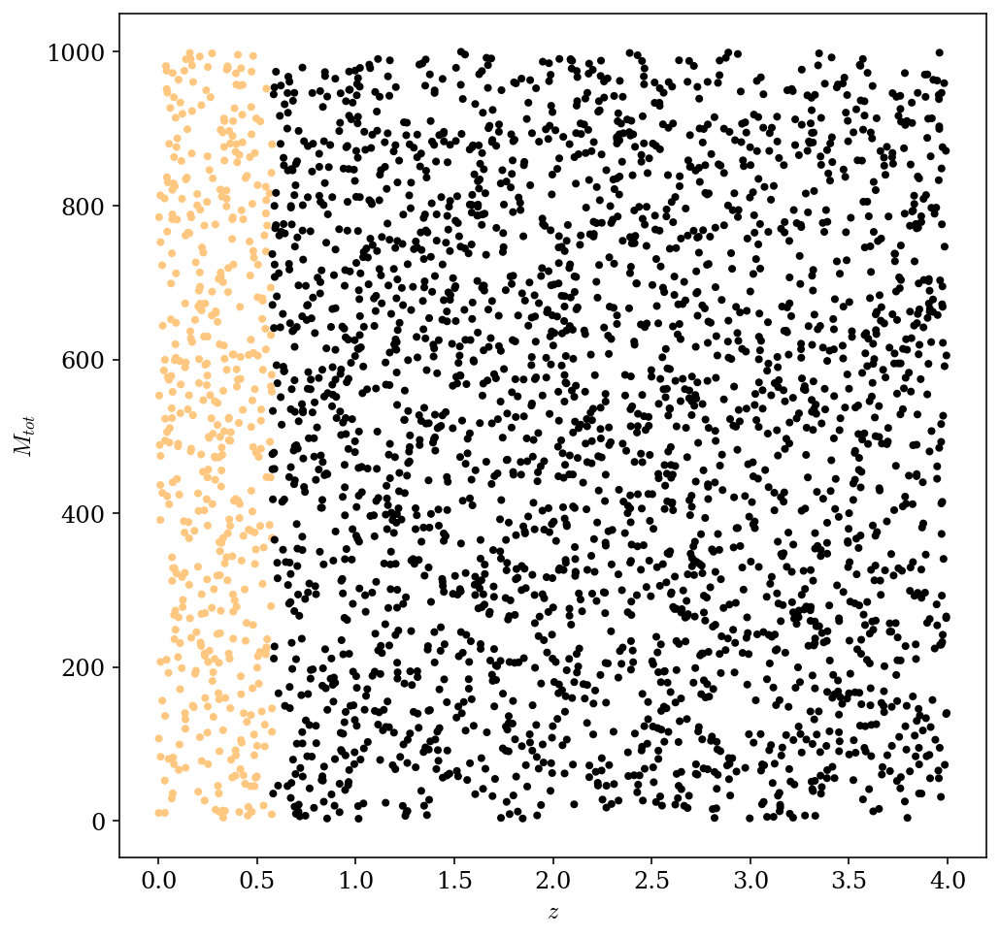

In [144]:
plt.scatter(data_test[:,0], data_test[:,1], marker = '.', c = labels, cmap = 'copper')
plt.xlabel(r'$z$')
plt.ylabel(r'$M_{tot}$')
plt.show()

better than GPR but worse than all the classification schemes besides naive bayes + PCA

## PYTORCH

In [145]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.utils.data as torchdata

In [146]:
# define structure of neural net
class Net(nn.Module):
    def __init__(self, nhidden):
        super(Net, self).__init__()
        self.fc_h = nn.Linear(7, nhidden)
        self.fc_o = nn.Linear(nhidden, 1)

    def forward(self, x):
        h = F.relu(self.fc_h(x))
        z = self.fc_o(h)
        return z

In [147]:
#rescale the data between -1 and 1
def rescale(X):
    X_scaled = np.zeros_like(X)
    for i in range(len(X[0])):
        lims = [min(X[:,i]), max(X[:,i])]
        X_scaled[:,i] = 1 - 2 * (X[:,i] - lims[0]) / (lims[1] - lims[0])
    return X_scaled

In [148]:
data_train_scaled = rescale(data_train)
data_test_scaled = rescale(data_test)

In [149]:
traindata = torchdata.TensorDataset(torch.tensor(data_train_scaled, dtype = torch.float), torch.tensor(det_train, dtype = torch.float).view(-1, 1))
testdata = torchdata.TensorDataset(torch.tensor(data_test_scaled, dtype = torch.float), torch.tensor(det_test, dtype = torch.float).view(-1, 1))

traindataloader = torchdata.DataLoader(traindata, 
                                       batch_size=32, 
                                       shuffle=True)

In [150]:
def train_NN(n_hidden):
    model = Net(n_hidden)
    criterion = torch.nn.MSELoss(reduction='sum') 
    # stochastic gradient descent
    optimizer = torch.optim.Adam(model.parameters(), lr=0.001) 
    # Adaptive learning rate...
    scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, 
                                                           verbose=True, 
                                                           patience=5, 
                                                           threshold=1e-3)
    min_valid_loss = float('inf')
    badepochs = 0
    for t in range(150):
        train_loss = 0
        for i, databatch in enumerate(traindataloader, 0):
            binary, det_ = databatch
            optimizer.zero_grad()
            det_pred = model(binary)
            loss = criterion(det_pred, det_)
            loss.backward()
            optimizer.step()
            train_loss += loss.item()
            
        with torch.no_grad():
            binary = testdata[:][0]
            dets = testdata[:][1]
            det_pred = model(binary)
            valid_loss = criterion(det_pred, dets)
            if t % 10 == 0:
                print('Epoch %i: train loss %0.3e validation loss %0.3e' % (t, \
                        train_loss / len(traindata), valid_loss / len(testdata)))
            # stop training if validation loss has not fallen in 10 epochs
            if valid_loss > min_valid_loss*(1-1e-3):
                badepochs += 1
            else:
                min_valid_loss = valid_loss
                badepochs = 0
            if badepochs == 10:
                print('Finished training')
                break
        scheduler.step(valid_loss)
    return model

In [151]:
from tqdm.notebook import tqdm #just to visually check the number of neurons we are using

@pickle_results('L20_networks.pkl')
def networks(neurons):
    accuracy_nn = []
    accuracy_best = 0
    for n_hidden in tqdm(neurons):
        model = train_NN(n_hidden)

        with torch.no_grad():
            binary = testdata[:][0]
            det_test = testdata[:][1]
            det_pred = model(binary)
    
            det_pred[det_pred >= 0.5] = 1
            det_pred[det_pred < 0.5] = 0

            accuracy_temp = len(det_pred[det_pred == det_test]) / len(det_pred)
            accuracy_nn.append(accuracy_temp)
            
            if accuracy_temp > accuracy_best:
                best_model = model
                accuracy_best = accuracy_temp
                
    return best_model, accuracy_nn

In [152]:
neurons = np.arange(8, 33, 2)
model, accuracy_nn = networks(neurons)

@pickle_results: computing results and saving to 'L20_networks.pkl'


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch 0: train loss 1.076e-01 validation loss 9.068e-02
Epoch 10: train loss 4.399e-02 validation loss 4.547e-02
Epoch 20: train loss 3.874e-02 validation loss 3.965e-02
Epoch 30: train loss 3.711e-02 validation loss 3.786e-02
Epoch 40: train loss 3.581e-02 validation loss 3.698e-02
Epoch 50: train loss 3.501e-02 validation loss 3.567e-02
Epoch 60: train loss 3.435e-02 validation loss 3.522e-02
Epoch 70: train loss 3.378e-02 validation loss 3.464e-02
Epoch 80: train loss 3.346e-02 validation loss 3.431e-02
Epoch 00086: reducing learning rate of group 0 to 1.0000e-04.
Epoch 90: train loss 3.275e-02 validation loss 3.383e-02
Epoch 100: train loss 3.270e-02 validation loss 3.378e-02
Epoch 00101: reducing learning rate of group 0 to 1.0000e-05.
Finished training
Epoch 0: train loss 1.012e-01 validation loss 8.763e-02
Epoch 10: train loss 4.044e-02 validation loss 4.116e-02
Epoch 20: train loss 3.630e-02 validation loss 3.716e-02
Epoch 30: train loss 3.470e-02 validation loss 3.520e-02
Epoc

In [153]:
for n, acc in zip(neurons, accuracy_nn):
    print('The accuracy of the NN with %.i  is %.4f' % (n, acc))

The accuracy of the NN with 8  is 0.9617
The accuracy of the NN with 10  is 0.9610
The accuracy of the NN with 12  is 0.9627
The accuracy of the NN with 14  is 0.9597
The accuracy of the NN with 16  is 0.9603
The accuracy of the NN with 18  is 0.9597
The accuracy of the NN with 20  is 0.9600
The accuracy of the NN with 22  is 0.9603
The accuracy of the NN with 24  is 0.9580
The accuracy of the NN with 26  is 0.9587
The accuracy of the NN with 28  is 0.9603
The accuracy of the NN with 30  is 0.9577
The accuracy of the NN with 32  is 0.9610


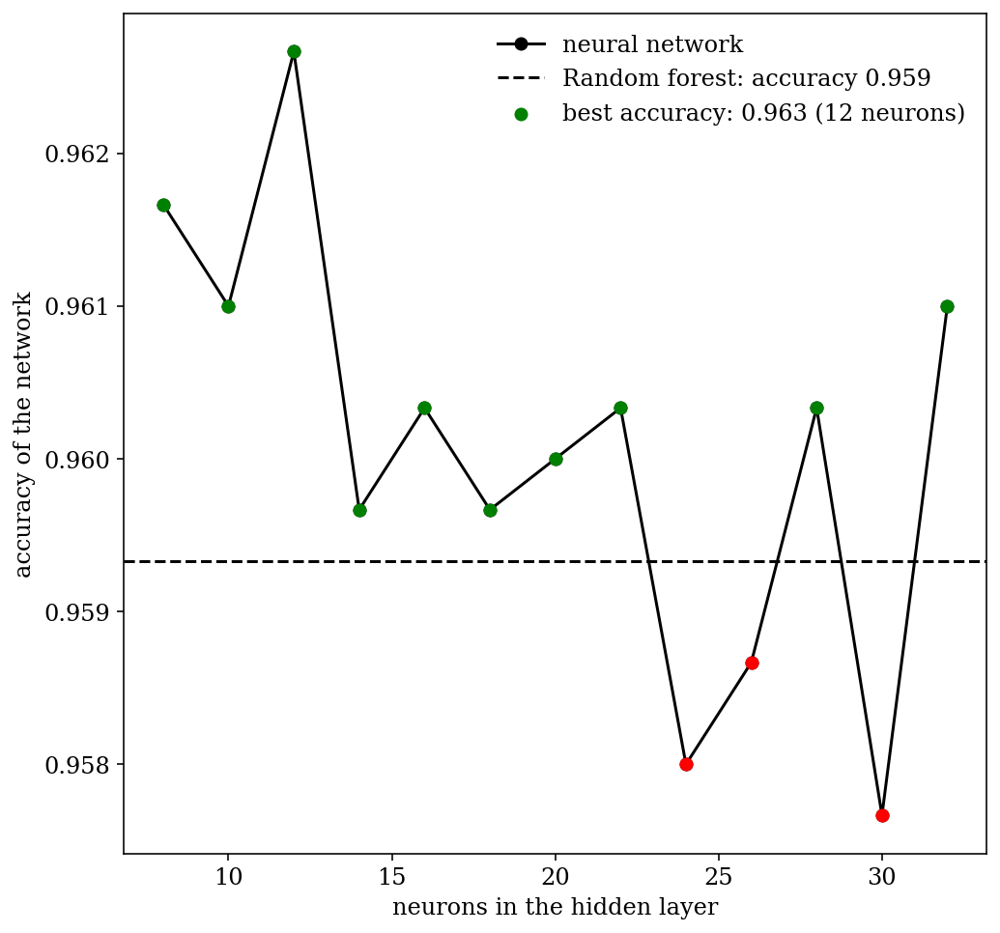

In [154]:
accuracy_nn = np.array(accuracy_nn)
idx_max = np.argmax(accuracy) #show the maximum accuracy reached using a 'standard' classifier/regressor (aka not a neural network)
idx_max_nn = np.argmax(accuracy_nn)

plt.plot(neurons, accuracy_nn, 'o-k', label = 'neural network', zorder = 1)
plt.axhline(accuracy[idx_max], linestyle = '--', color = 'k', label = methods[idx_max] + ': accuracy %.3f' % accuracy[idx_max])
mask = accuracy_nn > accuracy[idx_max]
plt.scatter(neurons[mask], accuracy_nn[mask], c = 'g', zorder = 2, label = 'best accuracy: %.3f (%.i neurons)' % (accuracy_nn[idx_max_nn], neurons[idx_max_nn]))
plt.scatter(neurons[~mask], accuracy_nn[~mask], c = 'r', zorder = 3)

plt.xlabel('neurons in the hidden layer')
plt.ylabel('accuracy of the network')

plt.legend(frameon = False)
plt.show()

Depending on the number of neurons, a neural network can perform slightly better than a random forest classifier (for example).  
Anyways, the improvement in accuracy is very small ($\sim 0.003$ in this case).